# 1. Starting the project

In [ ]:
import pandas as pd
import geopandas
import matplotlib.pyplot as plt
import folium
from google.colab import drive

In [ ]:
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Path relative to my Google Drive
FILE_PATH = '/content/gdrive/MyDrive/JICA研修ー２０２５/3_Hokkaido/takino_park/'
print(FILE_PATH)

/content/gdrive/MyDrive/JICA研修ー２０２５/3_Hokkaido/takino_park/


In [ ]:
filename = "takino_k9_2024102627.csv"

print("Loading data from geo_data.csv...")
df = pd.read_csv(FILE_PATH + filename)
print("Data loaded successfully.")

In [ ]:
# Display the first few rows to confirm it loaded correctly
print(df.head())

   INDEX  LINE ID RCR VALID    UTC DATE UTC TIME  LOCAL DATE LOCAL TIME  \
0      1        1   T   SPS  2024/10/26  2:30:14  2024/10/26   11:30:14   
1      2        1   T   SPS  2024/10/26  2:30:19  2024/10/26   11:30:19   
2      3        1   T   SPS  2024/10/26  2:30:24  2024/10/26   11:30:24   
3      4        1   T   SPS  2024/10/26  2:30:29  2024/10/26   11:30:29   
4      5        1   T   SPS  2024/10/26  2:30:34  2024/10/26   11:30:34   

    LATITUDE N/S   LONGITUDE E/W    ALTITUDE     SPEED     HEADING  G-X  G-Y  \
0  42.919134   N  141.386607   E  272.402527  0.112051  227.179175    0    0   
1  42.919101   N  141.386559   E  266.455475  0.606369  310.690421    0    0   
2  42.919107   N  141.386550   E  269.583038  0.386699   54.069365    0    0   
3  42.919113   N  141.386563   E  269.218567  0.218778  238.137352    0    0   
4  42.919110   N  141.386554   E  269.515137  0.136484   85.661763    0    0   

   G-Z              filename         filename_lineid  
0    0  takin

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4615 entries, 0 to 4614
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   INDEX            4615 non-null   int64  
 1   LINE ID          4615 non-null   int64  
 2   RCR              4615 non-null   object 
 3   VALID            4615 non-null   object 
 4   UTC DATE         4615 non-null   object 
 5   UTC TIME         4615 non-null   object 
 6   LOCAL DATE       4615 non-null   object 
 7   LOCAL TIME       4615 non-null   object 
 8   LATITUDE         4615 non-null   float64
 9   N/S              4615 non-null   object 
 10  LONGITUDE        4615 non-null   float64
 11  E/W              4615 non-null   object 
 12  ALTITUDE         4615 non-null   float64
 13  SPEED            4615 non-null   float64
 14  HEADING          4615 non-null   float64
 15  G-X              4615 non-null   int64  
 16  G-Y              4615 non-null   int64  
 17  G-Z           

## Creating new column for Datetime

In [ ]:
print("Combining and converting date/time columns...")
df['datetime'] = pd.to_datetime(df['UTC DATE'] + ' ' + df['UTC TIME'])

Combining and converting date/time columns...


In [ ]:
print(df.head())

   INDEX  LINE ID RCR VALID    UTC DATE UTC TIME  LOCAL DATE LOCAL TIME  \
0      1        1   T   SPS  2024/10/26  2:30:14  2024/10/26   11:30:14   
1      2        1   T   SPS  2024/10/26  2:30:19  2024/10/26   11:30:19   
2      3        1   T   SPS  2024/10/26  2:30:24  2024/10/26   11:30:24   
3      4        1   T   SPS  2024/10/26  2:30:29  2024/10/26   11:30:29   
4      5        1   T   SPS  2024/10/26  2:30:34  2024/10/26   11:30:34   

    LATITUDE N/S  ...  E/W    ALTITUDE     SPEED     HEADING  G-X  G-Y  G-Z  \
0  42.919134   N  ...    E  272.402527  0.112051  227.179175    0    0    0   
1  42.919101   N  ...    E  266.455475  0.606369  310.690421    0    0    0   
2  42.919107   N  ...    E  269.583038  0.386699   54.069365    0    0    0   
3  42.919113   N  ...    E  269.218567  0.218778  238.137352    0    0    0   
4  42.919110   N  ...    E  269.515137  0.136484   85.661763    0    0    0   

               filename         filename_lineid            datetime  
0  t

# 2. Creating GeoPandas Dataframe

- GeoPandas docs: https://geopandas.org/en/stable/getting_started/introduction.html
- Folium docs: https://python-visualization.github.io/folium/latest/index.html

In [ ]:
print("Creating geographic point geometries...")
geometry = geopandas.points_from_xy(df.LONGITUDE, df.LATITUDE)

Creating geographic point geometries...


In [ ]:
print("Creating the GeoDataFrame with CRS EPSG:4326...")
gdf = geopandas.GeoDataFrame(df, geometry=geometry, crs='EPSG:4326')

Creating the GeoDataFrame with CRS EPSG:4326...


In [ ]:
print("\nFirst 5 rows of the new GeoDataFrame:")
print(gdf.head())


First 5 rows of the new GeoDataFrame:
   INDEX  LINE ID RCR VALID    UTC DATE UTC TIME  LOCAL DATE LOCAL TIME  \
0      1        1   T   SPS  2024/10/26  2:30:14  2024/10/26   11:30:14   
1      2        1   T   SPS  2024/10/26  2:30:19  2024/10/26   11:30:19   
2      3        1   T   SPS  2024/10/26  2:30:24  2024/10/26   11:30:24   
3      4        1   T   SPS  2024/10/26  2:30:29  2024/10/26   11:30:29   
4      5        1   T   SPS  2024/10/26  2:30:34  2024/10/26   11:30:34   

    LATITUDE N/S  ...    ALTITUDE     SPEED     HEADING  G-X  G-Y  G-Z  \
0  42.919134   N  ...  272.402527  0.112051  227.179175    0    0    0   
1  42.919101   N  ...  266.455475  0.606369  310.690421    0    0    0   
2  42.919107   N  ...  269.583038  0.386699   54.069365    0    0    0   
3  42.919113   N  ...  269.218567  0.218778  238.137352    0    0    0   
4  42.919110   N  ...  269.515137  0.136484   85.661763    0    0    0   

               filename         filename_lineid            dateti

In [ ]:
print("\nGeoDataFrame Info:")
gdf.info()


GeoDataFrame Info:
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4615 entries, 0 to 4614
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   INDEX            4615 non-null   int64         
 1   LINE ID          4615 non-null   int64         
 2   RCR              4615 non-null   object        
 3   VALID            4615 non-null   object        
 4   UTC DATE         4615 non-null   object        
 5   UTC TIME         4615 non-null   object        
 6   LOCAL DATE       4615 non-null   object        
 7   LOCAL TIME       4615 non-null   object        
 8   LATITUDE         4615 non-null   float64       
 9   N/S              4615 non-null   object        
 10  LONGITUDE        4615 non-null   float64       
 11  E/W              4615 non-null   object        
 12  ALTITUDE         4615 non-null   float64       
 13  SPEED            4615 non-null   float64       
 14  HEADING     

## Plot data points

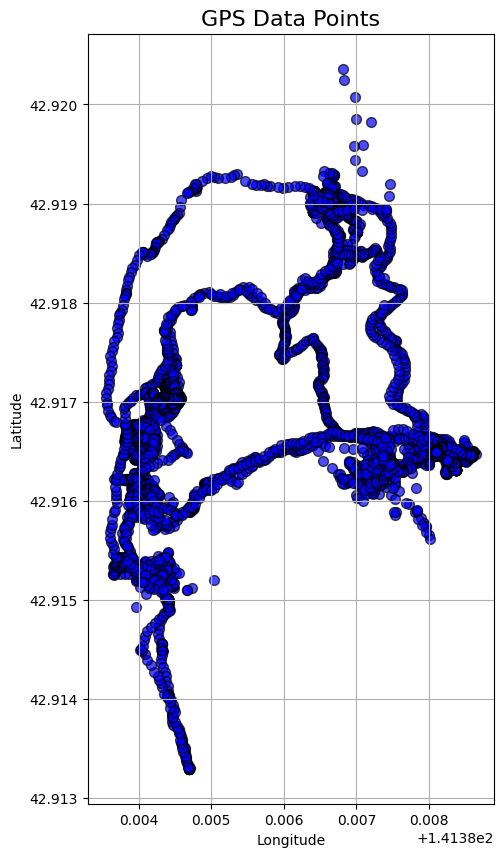

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
gdf.plot(
    ax=ax,
    marker='o',
    color='blue',
    markersize=50,
    alpha=0.7,
    edgecolor='black'
)

# 4. Add title and labels for clarity
ax.set_title("GPS Data Points", fontsize=16)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(True)

## Plot a folium map

In [ ]:
map_center = [gdf.geometry.y.mean(), gdf.geometry.x.mean()]
m = folium.Map(location=map_center, zoom_start=15)

In [ ]:
# 3. Add points to the map
#    We loop through each row in the GeoDataFrame to create a marker for it.
for idx, row in gdf.iterrows():
    # Create the popup text with HTML for formatting
    popup_text = f"""
    <b>Time (UTC):</b> {row['UTC TIME']}<br>
    <b>Speed:</b> {row['SPEED']:.2f}<br>
    <b>Altitude:</b> {row['ALTITUDE']:.2f}
    """

    # Create a Marker for each point
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        popup=popup_text,
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(m)

Visualize the map. You need to be looged in to see it

In [ ]:
m

In [ ]:
m.save("interactive_map.html")